# Visão Computacional - Irede
## Atividade Obrigatória - Processamento de Imagens - Unidade 01/Capítulo 01

**Por:** Luís Henrique Sousa Ribeiro

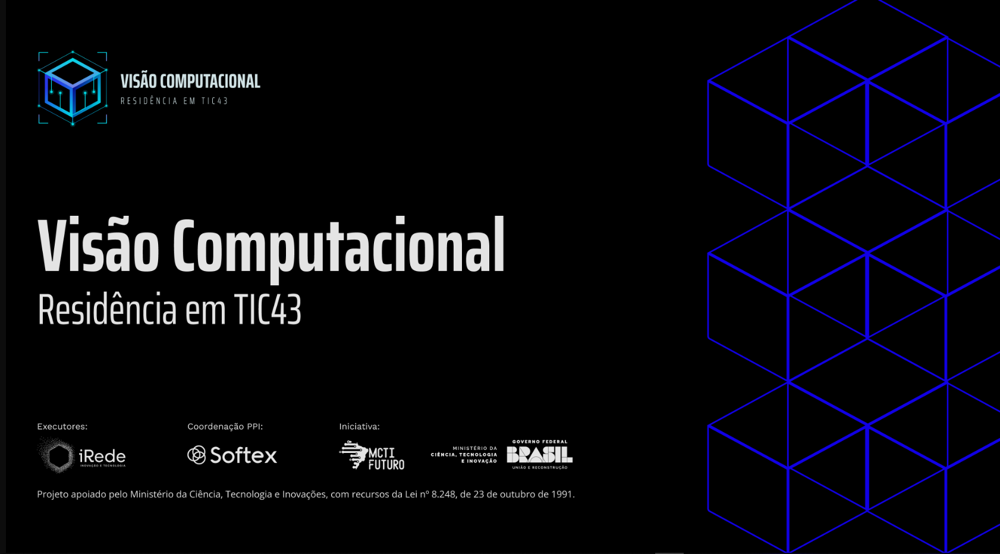

---

# Etapas do projeto:
1. Definição de Classes
2. Aquisição de Imagens
3. Transformação de Imagens
4. Estruturação do mini dataset

---

## 1 - Definição de Classes

Para o projeto da Atividade 01 desse curso de VC, eu escolhi como classes:
- Controle de videogame (Dualsense com capa de proteção)
- Mouse (sem fio)

São dois objetos que eu sempre vejo na minha mesa quando vou usar o computador, desenhar ou jogar, e também são dois aparelhos relacionados com a área de tecnologia e eletrônicos.

A partir disso, fiz a etapa de aquisição das imagens de cada um desses eletrônicos.

> CLASSES ESCOLHIDAS: Controle de PS5 e Mouse sem fio.

# 2 - Aquisição de Imagens

### Imports

In [1]:
import numpy as np 
import matplotlib.pyplot as plt 
import cv2
from pathlib import Path
import PIL
from io import BytesIO

### Visualizando as imagens captadas

In [2]:
caminho_imagens = Path("Imagens - Classes - VC")
arquivos_imagens = [arquivo for arquivo in caminho_imagens.iterdir()]

#### Dualsense - Controle de PS5

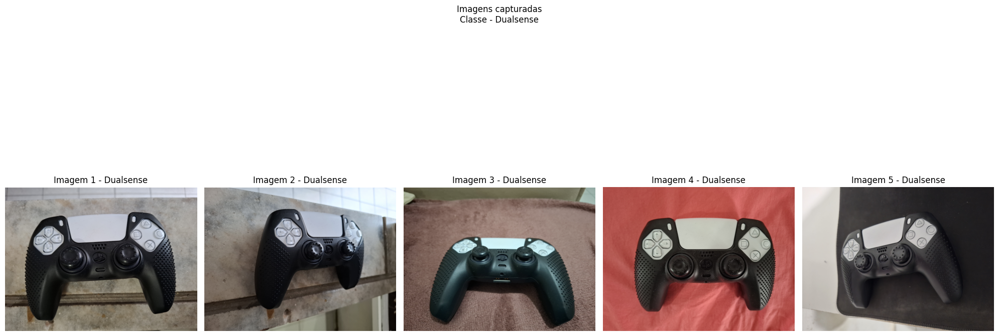

In [3]:
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20,10)) 

for indice, imagem in enumerate(arquivos_imagens[:5]): 

    ax = axes[indice]
    
    if indice <= 4:
        img_aberta = PIL.Image.open(imagem)
        ax.imshow(img_aberta)
        ax.set_title(f"Imagem {indice+1} - Dualsense")
        ax.axis("off")
        
fig.suptitle("Imagens capturadas\nClasse - Dualsense")
plt.tight_layout()
plt.show()

#### Mouse sem fio

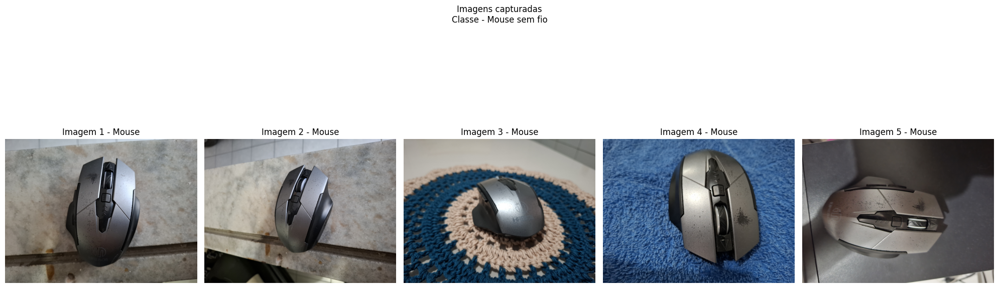

In [4]:
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20,8)) 

for indice, imagem in enumerate(arquivos_imagens[5:]): 

    ax = axes[indice]
    
    if indice <= 4:
        img_aberta = PIL.Image.open(imagem)
        ax.imshow(img_aberta)
        ax.set_title(f"Imagem {indice+1} - Mouse")
        ax.axis("off")
        
fig.suptitle("Imagens capturadas\nClasse - Mouse sem fio")
plt.tight_layout()
plt.show()

### Dispositivo utilizado para as fotos:
- Smartphone - Samsung Galaxy A55

### Condições de iluminação
As fotografias dos objetos foram realizadas foram realizadas em 2 locais diferentes:
- Janela do meu quarto
- Mesa

Na janela, retirei 3 fotos, com a iluminação ambiente e com a luz do meu quarto acesa. Na mesa, retirei a foto somente com iluminação artificial (ou seja, somente com a luz do quarto. As janelas estavam fechadas). As imagens foram registradas às 17h10 do dia 06/05, quando ainda estava claro e havia uma iluminação ambiente boa para as imagens.

### Distância aproximada
**Distâncias das imagens do controle (em ordem, conforme aparece no plot anterior):**
- `Imagem 01`: aproximadamente 15cm de distância, com a câmera apontada exatamente para o controle (visto de cima);
- `Imagem 02`: aproximadamente 17cm de distância, com a câmera em diagonal esquerda (mas ainda visto de cima, em certa parte) apontada para o controle;
- `Imagem 03`: aproximadamente 14cm de distância, com a câmera também apontada exatamente para o controle, porém na mesma altura;
- `Imagem 04`: aproximadamente 15cm de distância, com a câmera também apontada exatamente para o controle, sendo ele visto de cima;
- `Imagem 05`: aproximadamente 18cm de distância, com a câmera também em diagonal, porém à direita, e também visto de cima, em certa parte.

**Distâncias das imagens do mouse (em ordem, conforme aparece no plot logo acima dessa célula):**
- `Imagem 01`: aproximadamente 14cm de distância, com a câmera apontada exatamente para o mouse (visto de cima);
- `Imagem 02`: aproximadamente 19cm de distância, com a câmera em diagonal direita (visto de cima, em certa parte) apontada para o mouse;
- `Imagem 03`: aproximadamente 13cm de distância, com a câmera também apontada exatamente para o mouse, sendo ele visto levemente de cima pela esquerda, mas a partir de sua base, um pouco de trás;
- `Imagem 04`: aproximadamente 14cm de distância, com a câmera em direção ao mouse, levemente para cima, porém com ele sendo visto do topo para a base;
- `Imagem 05`: aproximadamente 16cm de distância, com a câmera também apontada exatamente para o mouse, sendo ele visto de cima.

### Não foi percebido ruído na imagem. Da mesma forma, não foi observado desfoque nos objetos das classes.
Somente em algumas zonas do ambiente ao redor. Esse desfoque do ambiente ao redor é algo que não pode ser 100% controlado pelo usuário, visto que a câmera precisava focar em alguma coisa para então capturar uma imagem com o foco correto, que era no objeto.

---

# 3 - Transformação de Imagens

Para 1 exemplo de cada classe, vamos gerar versões derivadas.

No nosso caso, vou utilizar a imagem 1 da classe Dualsense e a imagem 4 da classe Mouse.

## 3.1 - Análise de Resolução
- 1 versão em resolução original
- 1 versão com redução em 50% de resolução
- 1 versão com redução em 20% de resolução

In [5]:
img_dualsense_01 = cv2.imread("Imagens - Classes - VC/Dualsense - 01.png")
img_mouse_04 = cv2.imread("Imagens - Classes - VC/Mouse - 04.png")

print(type(img_dualsense_01), type(img_mouse_04))

<class 'numpy.ndarray'> <class 'numpy.ndarray'>


O OpenCV por padrão trabalha com imagens em BGR. Logo, caso a gente fosse imprimir as imagens usando plots, elas estariam com as cores erradas.

Para solucionar isso, vamos criar uma função simples que pega as imagens e converte suas cores de BGR para RGB.

In [6]:
def converte_bgr_para_rgb(imagem_bgr: np.ndarray) -> np.ndarray: 
    """
    Função para converter imagens BGR para RGB.
    
    imagem_bgr: imagem lida pelo OpenCV.
    """
    imagem_rgb = cv2.cvtColor(imagem_bgr, cv2.COLOR_BGR2RGB)

    return imagem_rgb

In [7]:
img_dualsense_01 = converte_bgr_para_rgb(img_dualsense_01)
img_mouse_04 = converte_bgr_para_rgb(img_mouse_04)

Agora que temos as imagens em RGB, podemos iniciar a análise de resolução.

Para a análise, vamos criar uma função que faz a redução da resolução de uma imagem. Isso nos permitirá também ver o aliasing da imagem após reduzir seu tamanho.

In [8]:
def reduz_resolucao_imagem(imagem_rgb, escala, interpolacao_aumentar, interpolacao_reduzir):
    imagem_original = imagem_rgb
    altura,largura = imagem_original.shape[:2]

    nova_largura = max(1, int(largura * escala))
    nova_altura = max(1, int(altura * escala))

    imagem_reduzida = cv2.resize(
        imagem_original,
        (nova_largura, nova_altura),
        interpolation = interpolacao_reduzir)

    imagem_aumentada_aliasing = cv2.resize(
        imagem_reduzida,
        (largura, altura),
        interpolation = interpolacao_aumentar
    )

    return imagem_reduzida, imagem_aumentada_aliasing

In [9]:
escalas = [0.5, 0.2]
imagens_redimensionadas = [] 
titulo_imagens_redimensionadas = []

### Visualizando as imagens do Dualsense com resoluções reduzidas

In [10]:
for escala in escalas:
    _, imagem_aumentada_aliasing = reduz_resolucao_imagem(img_dualsense_01, escala, cv2.INTER_NEAREST, cv2.INTER_NEAREST)
    imagens_redimensionadas.append(imagem_aumentada_aliasing)
    titulo_imagens_redimensionadas.append(f"Redução de {int(escala*100)}% da resolução")

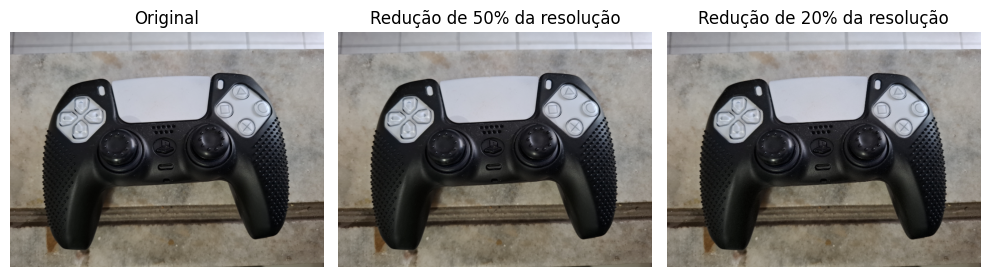

In [11]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 4))

for i in range(3):
    ax = axes[i]

    if (i == 0): 
        ax.imshow(img_dualsense_01)
        ax.set_title("Original")
        ax.axis("off")
    else:
        ax.imshow(imagens_redimensionadas[i-1])
        ax.set_title(titulo_imagens_redimensionadas[i-1])
        ax.axis("off")
        
plt.tight_layout()
plt.show();

Em uma primeira análise, torna-se quase imperceptível que houve uma redução da resolução das imagens.
Porém, se fizermos os testes com escalas menores, poderemos ter um resultado mais fácil de se perceber, conforme o código abaixo.

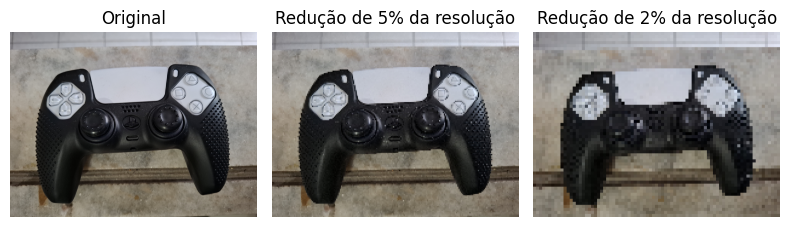

In [12]:
escalas_testes = [0.05, 0.02]
imagens_redimensionadas_testes = [] 
titulo_imagens_redimensionadas_testes = []

for escala in escalas_testes:
    _, imagem_aumentada_aliasing = reduz_resolucao_imagem(img_dualsense_01, escala, cv2.INTER_NEAREST, cv2.INTER_NEAREST)
    imagens_redimensionadas_testes.append(imagem_aumentada_aliasing)
    titulo_imagens_redimensionadas_testes.append(f"Redução de {int(escala*100)}% da resolução")


fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(8, 4))

for i in range(3):
    ax = axes[i]

    if (i == 0): 
        ax.imshow(img_dualsense_01)
        ax.set_title("Original")
        ax.axis("off")
    else:
        ax.imshow(imagens_redimensionadas_testes[i-1])
        ax.set_title(titulo_imagens_redimensionadas_testes[i-1])
        ax.axis("off")
        
plt.tight_layout()
plt.show();

### Visualizando as imagens do Mouse com resoluções reduzidas

In [13]:
escalas = [0.5, 0.2]
imagens_redimensionadas = [] 
titulo_imagens_redimensionadas = []

for escala in escalas:
    _, imagem_aumentada_aliasing = reduz_resolucao_imagem(img_mouse_04, escala, cv2.INTER_NEAREST, cv2.INTER_NEAREST)
    imagens_redimensionadas.append(imagem_aumentada_aliasing)
    titulo_imagens_redimensionadas.append(f"Redução de {int(escala*100)}% da resolução")

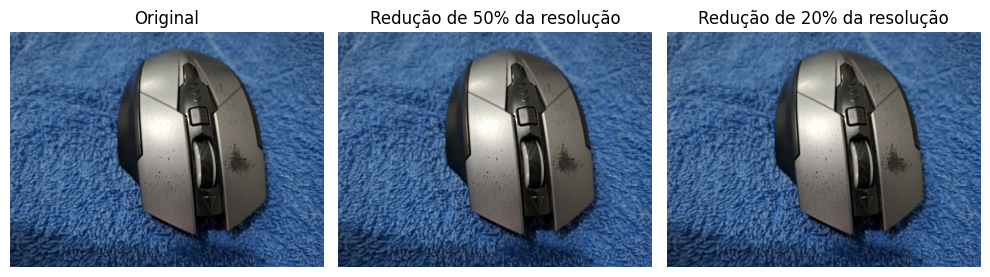

In [14]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 4))

for i in range(3):
    ax = axes[i]

    if (i == 0): 
        ax.imshow(img_mouse_04)
        ax.set_title("Original")
        ax.axis("off")
    else:
        ax.imshow(imagens_redimensionadas[i-1])
        ax.set_title(titulo_imagens_redimensionadas[i-1])
        ax.axis("off")
        
plt.tight_layout()
plt.show();

Da mesma forma que fizemos com o Dualsense, vamos visualizar o aliasing com resoluções menores que 50% e 20%

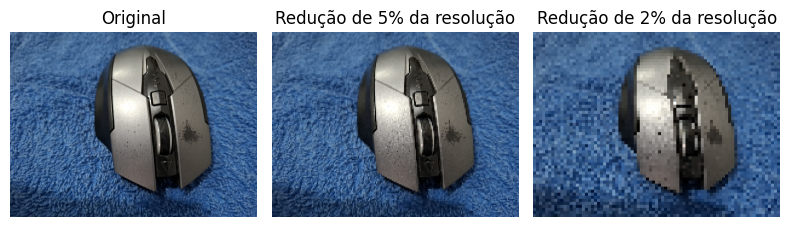

In [15]:
escalas_testes = [0.05, 0.02]
imagens_redimensionadas_testes = [] 
titulo_imagens_redimensionadas_testes = []

for escala in escalas_testes:
    _, imagem_aumentada_aliasing = reduz_resolucao_imagem(img_mouse_04, escala, cv2.INTER_NEAREST, cv2.INTER_NEAREST)
    imagens_redimensionadas_testes.append(imagem_aumentada_aliasing)
    titulo_imagens_redimensionadas_testes.append(f"Redução de {int(escala*100)}% da resolução")


fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(8, 4))

for i in range(3):
    ax = axes[i]

    if (i == 0): 
        ax.imshow(img_mouse_04)
        ax.set_title("Original")
        ax.axis("off")
    else:
        ax.imshow(imagens_redimensionadas_testes[i-1])
        ax.set_title(titulo_imagens_redimensionadas_testes[i-1])
        ax.axis("off")
        
plt.tight_layout()
plt.show();

### Veredito final sobre a perda de resolução:
No geral, como a imagem original é ENORME (e nem eu imaginava que era tão grande assim, com 4080 de altura X 3060 de largura), acabou que se tornou quase imperceptível a diferença entre as imagens original e reduzidas em 50% e 20% de sua resolução.

Porém, mesmo sendo imperceptível, a quantidade de pixels da imagem diminuiu bastante:
> De 4080x3060 pixels foi para 2040x1530 (50%) e depois para 816x612 (20%).

Essa diferença é ABSURDA, principalmente em termos de processamento em Visão Computacional.

A redução de resolução funciona muito bem, e a imagem com menos pixels se torna mais leve e eficiente de processar, visto que possui menos informações (o que pode ser um ponto negativo em casos de problemas de OCR por exemplo).

Sobre perda de informações, como eu citei acima no caso de OCR, isso pode ser ruim, visto que pode tirar informações importantes da imagem. 

Entretanto, por se tratar da criação de um dataset com duas classes que poderá ser usado para projetos de classificação de imagens, acaba que não é necessário uma imagem grande e com muitas informações no pipeline, pois as principais características dos objetos ainda são percebidas mesmo com a imagem reduzida (e a gente viu isso de forma bem clara quando reduzimos ambas as imagens para 5% e 2%. Mesmo estando bem serrilhado, ainda dava pra saber que era um controle e um mouse).

## 3.2 - Espaços de cor

Vamos gerar 1 exemplo de cada classe visualização em:
- RGB
- HSV.
- Escala de cinza

Nessa etapa, vamos mudar as imagens. Usaremos agora a imagem 4 da classe do Dualsense e a imagem 3 da classe do Mouse.

In [16]:
img_dualsense_04 = cv2.imread("Imagens - Classes - VC/Dualsense - 04.png")
img_mouse_03 = cv2.imread("Imagens - Classes - VC/Mouse - 03.png")

img_dualsense_04 = converte_bgr_para_rgb(img_dualsense_04)
img_mouse_03 = converte_bgr_para_rgb(img_mouse_03)

print(type(img_dualsense_04), type(img_mouse_03))

<class 'numpy.ndarray'> <class 'numpy.ndarray'>


### Função para converter imagem para Escala de Cinza / GrayScale

In [17]:
def rgb_para_grayscale(imagem_rgb: np.ndarray) -> np.ndarray:
    imagem_cinza = cv2.cvtColor(imagem_rgb, cv2.COLOR_RGB2GRAY)

    return imagem_cinza

In [18]:
def bgr_para_grayscale(imagem_bgr: np.ndarray) -> np.ndarray:
    imagem_cinza = cv2.cvtColor(imagem_bgr, cv2.COLOR_BGR2GRAY)

    return imagem_cinza

### Função para converter imagem para HSV

In [19]:
def rgb_para_hsv(imagem_rgb: np.ndarray): 
    imagem_hsv = cv2.cvtColor(imagem_rgb, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(imagem_hsv)

    h_reescalonado_255 = np.uint8(h.astype(np.float32) * 255.0 / 179.0)

    return h_reescalonado_255, s, v

### Analisando e visualizando as imagens em RGB, GrayScale e HSV

#### RGB

Vamos começar nossa análise verificando se as 2 imagens em RGB utilizam todas as cores do espectro de 0 a 255. Em adição, analisaremos também o seu shape e o tipo das imagens.

In [20]:
analise_rgb = f"""
====== ANÁLISE DE IMAGENS EM RGB ======

Dualsense (Imagem 05)

Shape: {img_dualsense_04.shape}
Tipo: {img_dualsense_04.dtype}
Faixa Min-Max (Espectro 0 - 255): {img_dualsense_04.min()} - {img_dualsense_04.max()}

--- 

Mouse (Imagem 02)

Shape: {img_mouse_03.shape}
Tipo: {img_mouse_03.dtype}
Faixa Min-Max (Espectro 0 - 255): {img_mouse_03.min()} - {img_mouse_03.max()}

"""

print(analise_rgb)


====== ANÁLISE DE IMAGENS EM RGB ======

Dualsense (Imagem 05)

Shape: (3060, 4080, 3)
Tipo: uint8
Faixa Min-Max (Espectro 0 - 255): 0 - 255

--- 

Mouse (Imagem 02)

Shape: (3060, 4080, 3)
Tipo: uint8
Faixa Min-Max (Espectro 0 - 255): 0 - 255




Vamos agora separar os canais de cores, e em seguida vamos visualizar

In [21]:
R_dualsense = img_dualsense_04[..., 0]
G_dualsense = img_dualsense_04[..., 1]
B_dualsense = img_dualsense_04[..., 2]

R_mouse = img_mouse_03[..., 0]
G_mouse = img_mouse_03[..., 1]
B_mouse = img_mouse_03[..., 2]

In [22]:
print(R_dualsense.mean())
print(G_dualsense.mean())
print(B_dualsense.mean())

148.98674868640268
85.64352012046649
80.28739939766757


In [23]:
print(R_mouse.mean())
print(G_mouse.mean())
print(B_mouse.mean())

97.09823649557862
103.50285835576061
107.03348752082532


**NOTE:** as médias da foto do Dualsense estão bem distantes (148, 85, 80), enquanto as médias da imagem do Mouse está entre 97 e 107 (bem mais próximas). Diante disso, como as cores do Mouse estão com valores médios próximos, a visualização das imagens em seus canais separados com `cmap="gray"` parecer que elas estão iguais, sem tantas diferenças visíveis. 
<br>Por outro lado, a visualização dos canais separados da imagem do Dualsense vai ser bem mais visíviel, por conta da diferença alta entre os valores das médias (com exceção dos valores G e B, que estão próximos e podem também dar uma impressão que não houveram tantas mudanças) 

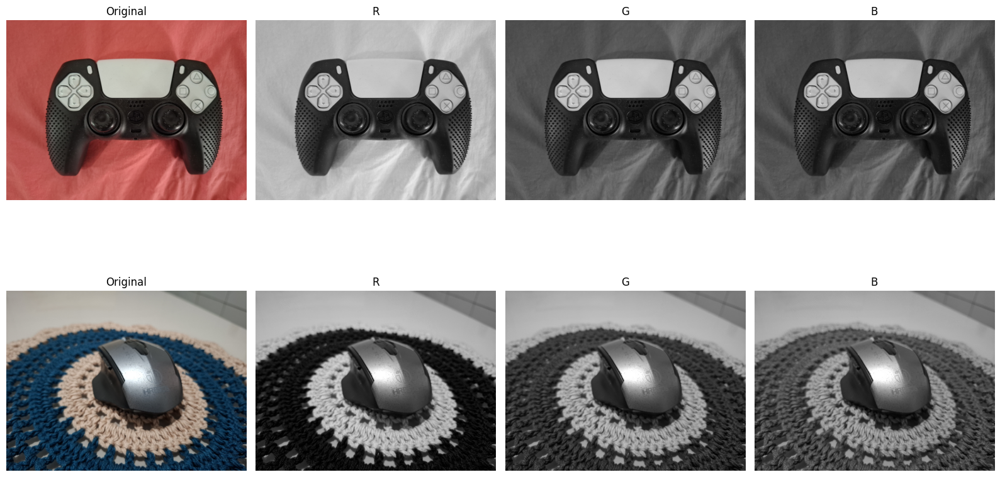

In [24]:
lista_nomes_canais = ['R', 'G', 'B']
lista_imagens_canais_dualsense = list([R_dualsense, G_dualsense, B_dualsense])
lista_imagens_canais_mouse = list([R_mouse, G_mouse, B_mouse])
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16,10))

for i in range(2):
    for j in range(4): 
        ax = axes[i][j] 

        if (i == 0 and j == 0):
            ax.imshow(img_dualsense_04)
            ax.set_title("Original")
            ax.axis("off")
            
        elif (i == 0 and j != 0):
            ax.imshow(lista_imagens_canais_dualsense[j-1], cmap="gray")
            ax.set_title(lista_nomes_canais[j-1])
            ax.axis("off")
            
        elif (i == 1 and j == 0): 
            ax.imshow(img_mouse_03)
            ax.set_title("Original")
            ax.axis("off")

        else:
            ax.imshow(lista_imagens_canais_mouse[j-1], cmap="gray")
            ax.set_title(lista_nomes_canais[j-1])
            ax.axis("off")
            
plt.tight_layout()
plt.show();

### HSV

Vamos agora fazer a visualização em HSV.

In [25]:
dualsense_h, dualsense_s, dualsense_v = rgb_para_hsv(img_dualsense_04)
mouse_h, mouse_s, mouse_v = rgb_para_hsv(img_mouse_03)

Vamos agora fazer dois plots.

A princípio, serão as mesmas imagens, porém, uma será só os canais H,S,V puros, e outra será com `cmap="gray"`. O objetivo disso é vermos como cada canal é de fato em um plot, estando e não estando "colorido" de tons de cinza.

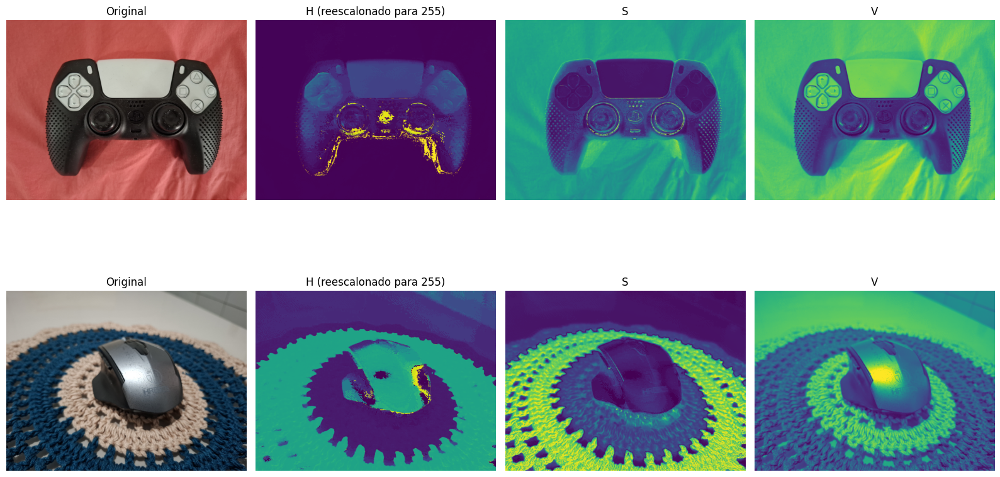

In [26]:
lista_nomes_canais = ['H (reescalonado para 255)', 'S', 'V']
lista_imagens_canais_dualsense = list([dualsense_h, dualsense_s, dualsense_v])
lista_imagens_canais_mouse = list([mouse_h, mouse_s, mouse_v])
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16,10))

for i in range(2):
    for j in range(4): 
        ax = axes[i][j] 

        if (i == 0 and j == 0):
            ax.imshow(img_dualsense_04)
            ax.set_title("Original")
            ax.axis("off")
            
        elif (i == 0 and j != 0):
            ax.imshow(lista_imagens_canais_dualsense[j-1])
            ax.set_title(lista_nomes_canais[j-1])
            ax.axis("off")
            
        elif (i == 1 and j == 0): 
            ax.imshow(img_mouse_03)
            ax.set_title("Original")
            ax.axis("off")

        else:
            ax.imshow(lista_imagens_canais_mouse[j-1])
            ax.set_title(lista_nomes_canais[j-1])
            ax.axis("off")
            
plt.tight_layout()
plt.show();

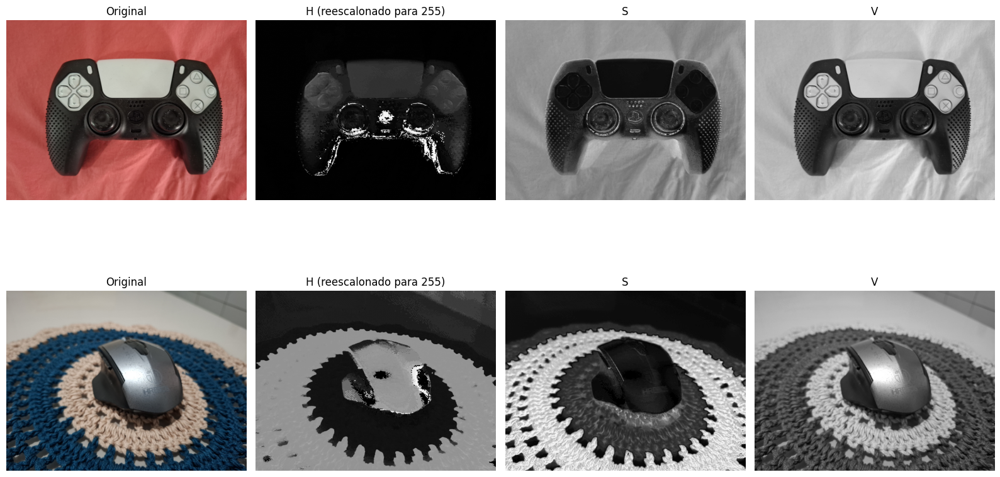

In [27]:
lista_nomes_canais = ['H (reescalonado para 255)', 'S', 'V']
lista_imagens_canais_dualsense = list([dualsense_h, dualsense_s, dualsense_v])
lista_imagens_canais_mouse = list([mouse_h, mouse_s, mouse_v])
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(16,10))

for i in range(2):
    for j in range(4): 
        ax = axes[i][j] 

        if (i == 0 and j == 0):
            ax.imshow(img_dualsense_04)
            ax.set_title("Original")
            ax.axis("off")
            
        elif (i == 0 and j != 0):
            ax.imshow(lista_imagens_canais_dualsense[j-1], cmap="gray")
            ax.set_title(lista_nomes_canais[j-1])
            ax.axis("off")
            
        elif (i == 1 and j == 0): 
            ax.imshow(img_mouse_03)
            ax.set_title("Original")
            ax.axis("off")

        else:
            ax.imshow(lista_imagens_canais_mouse[j-1], cmap="gray")
            ax.set_title(lista_nomes_canais[j-1])
            ax.axis("off")
            
plt.tight_layout()
plt.show();

Isso acontece nas visualizações de HSV porque esses valores são, respectivamente, de Matiz (eixo em graus com valores de 0 - 179, por isso escalonamos), Saturação (áreas com cores mais vivas e menos saturadas) e Valor (brilho - áreas escuras).

#### GrayScale

Por fim, vamos para a visualização mais simples, que é de GrayScale.<br>
Basicamente, a única coisa que precisamos fazer é converter a imagem para cinza e pronto! Não será necessário separar canais ou algo do tipo, visto que escala de cinza é apenas um canal, que é o canal que varia os tons de cinza da imagem.

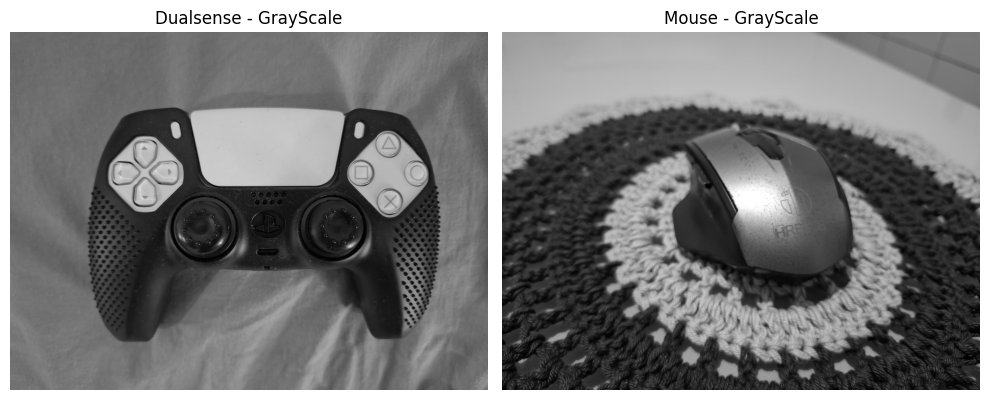

In [28]:
img_dualsense_04_gray = rgb_para_grayscale(img_dualsense_04)
img_mouse_03_gray = rgb_para_grayscale(img_mouse_03)
imagens_cinza = [img_dualsense_04_gray, img_mouse_03_gray]
nomes_imagens =['Dualsense - GrayScale', 'Mouse - GrayScale']

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,6))

for i in range(2):
    ax = axes[i] 

    ax.imshow(imagens_cinza[i], cmap="gray", vmin=0, vmax=255)
    ax.set_title(nomes_imagens[i])
    ax.axis("off")

plt.tight_layout()
plt.show()

### Veredito final sobre análise de cores:

Foram bem notórias as diferenças vistas entre RGB, HSV e GrayScale.<br>

**RGB:** <br>
No RGB, a diferença foi visível na separação de canais. Na imagem do Dualsense, que possui um fundo predominantemente rosa, o canal R apareceu com valores mais altos, apresentando uma imagem clara. Em oposição a isso, os canais G e B já apresentavam imagens mais escuras e parecidas entre eles. Muito disso a gente já conseguiu prever ao analisar o valor médio de cada um dos canais, que ajudou a mostrar quais canais apresentavam valores médios próximos entre si (o que traria uma visualização semelhante, mesmo sendo canais diferentes) e valores médios distantes entre si, o que traria uma distinção maior na visualização dos canais (que foi o que aconteceu quando a gente comparou o canal R, que estava bem claro, com o G, que já estava mais escuro).

O RGB acaba sendo um formato que envolve muito cores e iluminação, sendo ótimo para aplicar por exemplo em projetos de visão computacional voltados para detecções de fogo ou algo que envolva diretamente as cores. A variação cromática auxilia na detecção, e a separação de cada um dos canais (a fim de descobrir qual está mais presente em uma imagem) também pode ajudar. Sob o ponto de vista da PDI propriamente dita, é bem interessante o uso de RGB para análise de histogramas e para manipular as cores de uma imagem através dos canais separados, o que pode até ser usado de certa forma em aplicações que envolvem design gráfico. Ex: preciso de um sistema me retorna as imagens que eu quero a partir do nome da cor predominante - eu posso criar um sistema que pega um dataset, faz a leitura das imagens, analisa quais tem maior presença de vermelho, e me retorna essas imagens.

<br>

**HSV:** <br>
No HSV, a visualização foi ainda mais interessante.<br>
H (Hue - Matiz), S (Saturation - Saturação), V (Value - Valor/Brilho) são valores que apresentam visualizações peculiares, visto que o H consiste em um ângulo que varia de 0 a 179 (pois o HSV é geralmente visto como um cilindro, que possui graus para cada uma das cores), o S marca as áreas mais e menos saturadas e o V marca as áreas mais claras e escuras. <br>
Ao plotar, a gente viu como o H é visto de uma forma diferente, como o S mostra as áreas mais e menos saturadas (onde fica bem mais fácil de saber qual é qual ao comparar com a imagem original e com cmap=gray) e o V retorando praticamente a imagem parecida com a original, visto que só mostra as partes escuras e claras da imagem.

E o mais importante: o HSV dá um controle MUITO MAIS PRECISO da imagem! Eu consigo manipular (muito melhor e mais facilmente que no RGB) o tom, saturação e brilho da imagem de forma separada,, o que facilita muito em projetos de visão computacional que envolvem segmentação por cores ou projetos de detecção onde justamente a característica principal é a cor, e que as imagens/vídeos do dataset apresentam muita variação de iluminação e afins. O HSV me ajuda a controlar tudo isso.

<br>

**GrayScale:** <br>
O GrayScale por sua vez foi a visualização mais simples. As imagens agora estão em tons de cinza, com valores minimos em 0 e máximos em 255, com um canal variando os tons de cinza da imagem.
Acaba sendo muito útil em projetos de visão computacional que envolvem a detecção de objetos, rostos e afins, onde a cor acaba não sendo a feature principal.

No próprio OpenCV, é possível fazer testes de detecção de faces onde fazemos o uso de imagens em escalas de cinza.



## 3.3 - Quantização

Vamos agora para a etapa de quantização, onde pegamos uma imagem cinza de 8bit (0 - 255) e reduzimos a quantidade de tons distintos para a quantidade de níveis que passamos, com esses tons sendo redistribuídos uniformemente pelos pixels da imagem.

A fórmula para isso é pegar o respectivo valor da imagem que está no intervalo de 0 a 255 e multiplicar pelo resultado de uma divisão entre a quantidade de níveis que passamos no parâmetro da função e 255.0.

```
x * ((levels-1)/255.0)
```

Em seguida, fazemos o processo oposto, onde fazemos:

```
x * 255 / (levels-1)
```

In [29]:
def quantizacao(img_cinza: np.ndarray, niveis: int):
    """
    Função para fazer a quantização de uma imagem em tons de cinza para a quantidade de níveis passados em levels
    img_cinza: Imagem em tons de cinza 
    niveis: Quantidade de níveis distintos que queremos que a imagem tenha
    Ao final, retorna a imagem uint no intervalo [0,255], mas com os valores redistribuídos
    """

    if (niveis < 2 or niveis > 256):
        raise ValueError("Níveis precisa estar entre 2 e 256!")
    if (niveis & (niveis-1)) != 0: 
        raise ValueError("Níveis precisa ser potência de 2!")

    img_quantizada = np.round(img_cinza.astype(np.float32) * (niveis - 1) / 255.0).astype(np.int32)

    img_quantizada_reconstruida_255 = np.round(img_quantizada.astype(np.float32) * 255.0 / (niveis - 1)).astype(np.int32)

    return img_quantizada_reconstruida_255

Agora, criaremos uma função que conta exatamente quantos níveis a nossa imagem está utilizando.

> LEMBRANDO: Se fizermos a quantização de uma imagem para 256 níveis, isso significa que ela pode usar ATÉ 256 NÍVEIS, e não que ela usará fechado todos os níveis!

In [30]:
def conta_niveis_usados(img_quantizada_reconstruida_255: np.ndarray) -> int:
    return np.unique(img_quantizada_reconstruida_255).size

Agora vamos visualizar na prática a quantização.

Faremos para os seguintes níveis:
- 256
- 64
- 32
- 2

Usaremos a imagem 3 do Dualsense e a imagem 5 do Mouse

In [31]:
def visualizar_quantizacao_niveis(img_cinza: np.ndarray, lista_de_niveis: list, titulo: str): 
    qtd_niveis = len(lista_de_niveis)
    fig, axes = plt.subplots(nrows=1, ncols=qtd_niveis, figsize=(qtd_niveis*4, qtd_niveis))

    for indice, nivel in enumerate(lista_de_niveis):
        ax = axes[indice]
        imagem_quantizada = quantizacao(img_cinza, nivel)
        niveis_usados = conta_niveis_usados(imagem_quantizada)
        ax.imshow(imagem_quantizada, cmap="gray")
        ax.axis("off")
        ax.set_title(f"Níveis: {nivel} \nQtd de níveis usados: {niveis_usados}")

    if titulo:
        fig.suptitle(titulo)
    plt.tight_layout()
    plt.show()

In [32]:
img_dualsense_03 = cv2.imread("Imagens - Classes - VC/Dualsense - 03.png")
img_mouse_05 = cv2.imread("Imagens - Classes - VC/Mouse - 05.png")

img_dualsense_03_gray = bgr_para_grayscale(img_dualsense_03)
img_mouse_05_gray = bgr_para_grayscale(img_mouse_05)

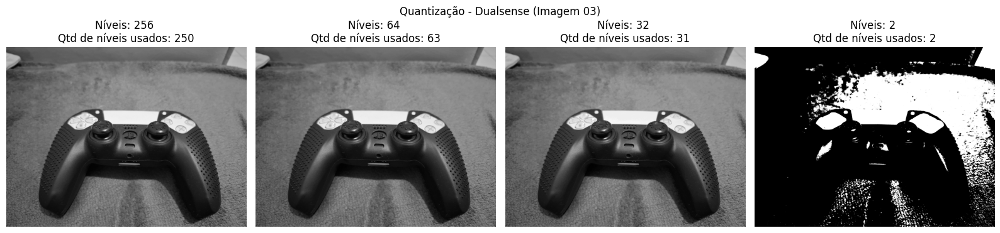

In [33]:
visualizar_quantizacao_niveis(img_dualsense_03_gray, [256, 64, 32, 2], "Quantização - Dualsense (Imagem 03)")

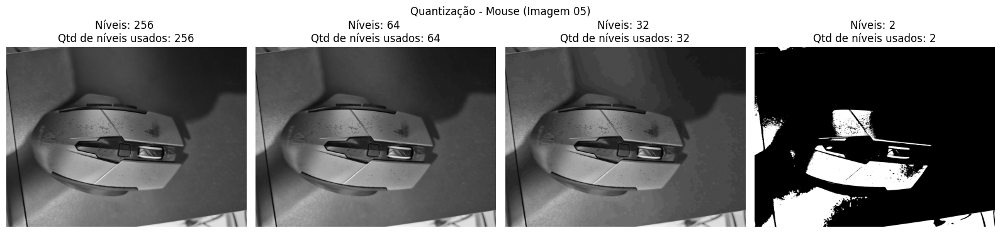

In [34]:
visualizar_quantizacao_niveis(img_mouse_05_gray, [256, 64, 32, 2], "Quantização - Mouse (Imagem 05)")

Agora vamos visualizar a quantização com mais níveis.

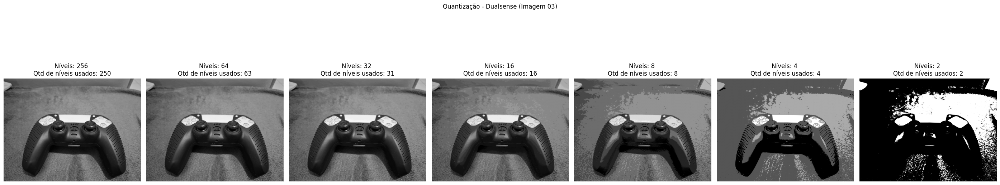

In [35]:
visualizar_quantizacao_niveis(img_dualsense_03_gray, [256, 64, 32, 16, 8, 4, 2], "Quantização - Dualsense (Imagem 03)")

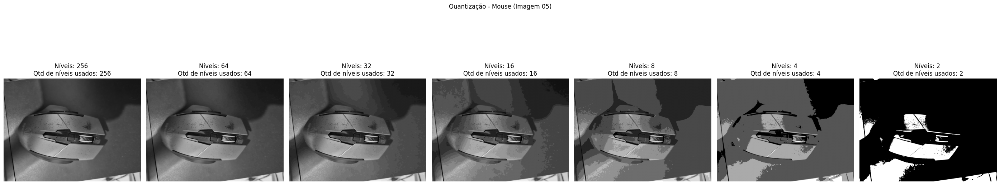

In [36]:
visualizar_quantizacao_niveis(img_mouse_05_gray, [256, 64, 32, 16, 8, 4, 2], "Quantização - Mouse (Imagem 05)")

Vamos testar agora a quantização com outras imagens

In [37]:
img_dualsense_05_gray = bgr_para_grayscale(cv2.imread("Imagens - Classes - VC/Dualsense - 05.png"))
img_mouse_02_gray = bgr_para_grayscale(cv2.imread("Imagens - Classes - VC/Mouse - 02.png"))

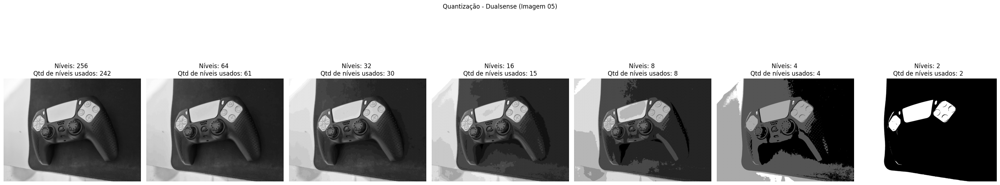

In [38]:
visualizar_quantizacao_niveis(img_dualsense_05_gray, [256, 64, 32, 16, 8, 4, 2], "Quantização - Dualsense (Imagem 05)")

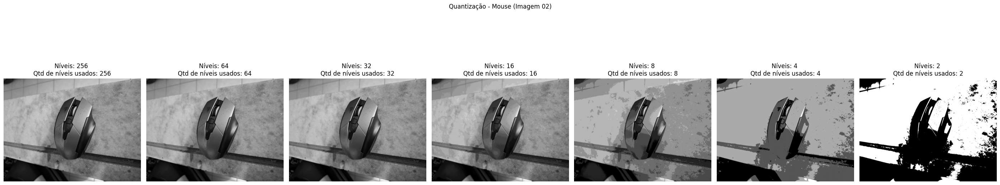

In [39]:
visualizar_quantizacao_niveis(img_mouse_02_gray, [256, 64, 32, 16, 8, 4, 2], "Quantização - Mouse (Imagem 02)")

### Veredito sobre quantização:

A quantização das imagens do controle e do mouse não demonstraram uma perda muito brusca de informações (apesar que, após reduzir para 2 níveis, acabou ficando um pouquinho mais difícil de encontrar o controle e o mouse), e muito disso se deve aos níveis de teste, que foram respectivamente 256, 64, 32 e 2.

No entanto, quando reduzimos os níveis para 256, 64, 32, 16, 8, 4, 2, ficou mais nítida a perda dos detalhes conforme vamos diminuindo os níveis.
Na imagem do Dualsense, o controle e suas principáis características ainda estavam visíveis até os 4 níveis. Na imagem do Mouse, a história foi diferente, e os detalhes principais elementos ficaram visiveis até os 8 níveis. Daí em diante, ficou com bem menos informações.

Para o dataset em específico, usando como base os resultados obtidos acima e visando, por exemplo, uma aplicação onde o foco é detectar manchas nos objetos (usando até como base aquela mancha enorme no botão esquerdo do mouse), as quantizações de 8 níveis e 4 níveis seriam uma boa escolha (para essa aplicação de detecção de manchas, especificamente), visto que não há uma perda muito brusca das informações e deixa em um nível ideal, que junta uma redução de custo computacional com a presença de features principais da imagem.

Imaginando uma outra aplicação, por exemplo de classificação se a imagem é de um mouse ou de um controle, as imagens de 16 níveis e 8 níveis já apresentam um bom equilíbrio entre redução de custo e extrair ruídos e aspectos desnecessários das imagens. Aqui é importante deixar claro que pra gente uma imagem quantizada, mesmo que seja por exemplo em 4 níveis ou 2, ainda pode ser, PARA NÓS, fácil de reconhecer o objeto, porém para ML é bem diferente a história. Diante disso, 8 níveis em uma aplicação de classificação, conforme os resultados vistos acima, pode ser uma escolha boa.

A escolha vai depender, óbviamente, da aplicação que faremos e também de testes reais!

## 3.4 - Salvando em diferentes formatos

Vamos salvar os arquivos de nossas imagens em JPEG e PNG.

> OBS: A minha pasta de arquivos de imagens por padrão já é em PNG, então farei apenas a contagem de MB do tamanho dessa pasta.

### Convertendo as imagens para JPEG

Vamos criar um script que pega a pasta de imagens que utilizei durante o projeto e converte cada imagem para JPEG, e a partir disso salva em uma pasta chamada "Imagens - Classes - VC - JPEG"

In [40]:
caminho_imagens = Path("Imagens - Classes - VC")
arquivos_imagens = [arquivo for arquivo in caminho_imagens.iterdir()]

In [41]:
pasta_jpeg = Path("Imagens - Classes - VC - JPEG")
pasta_jpeg.mkdir(exist_ok=True)

extensoes_validas = ['.png']

for arquivo in arquivos_imagens:
    if arquivo.is_file() and arquivo.suffix.lower() in extensoes_validas: 
        img = PIL.Image.open(arquivo)
        img = img.convert("RGB")
        novo_nome = arquivo.stem + ".jpeg"
        caminho_saida = pasta_jpeg / novo_nome

        img.save(
            caminho_saida, 
            format="JPEG",
            quality=95
        )

tamanho_total_jpeg = sum(arquivo.stat().st_size for arquivo in pasta_jpeg.iterdir() if arquivo.is_file())
tamanho_total_jpeg_mb = tamanho_total_jpeg / (1024**2)
print(f"Tamanho total da pasta JPEG (somatório do tamanho das imagens): ~{tamanho_total_jpeg_mb:.2f}MB")

Tamanho total da pasta JPEG (somatório do tamanho das imagens): ~22.89MB


In [42]:
tamanho_pasta_png = sum(arquivo.stat().st_size for arquivo in caminho_imagens.rglob('*') if arquivo.is_file())

tamanho_pasta_imagens_png_mb = tamanho_pasta_png / (1024**2)
print(f'Tamanho (MB) do somatório dos tamanhos em PNG (pasta de imagens que usei durante o projeto): ~{tamanho_pasta_imagens_png_mb:.2f}MB')

Tamanho (MB) do somatório dos tamanhos em PNG (pasta de imagens que usei durante o projeto): ~93.15MB


Agora vamos visualizar as 10 imagens de cada Dataset (PNG e JPEG) e vamos compará-los a fim de encontrar diferenças visuais.

In [43]:
arquivo_imagens_jpeg = [arquivo for arquivo in pasta_jpeg.iterdir()]

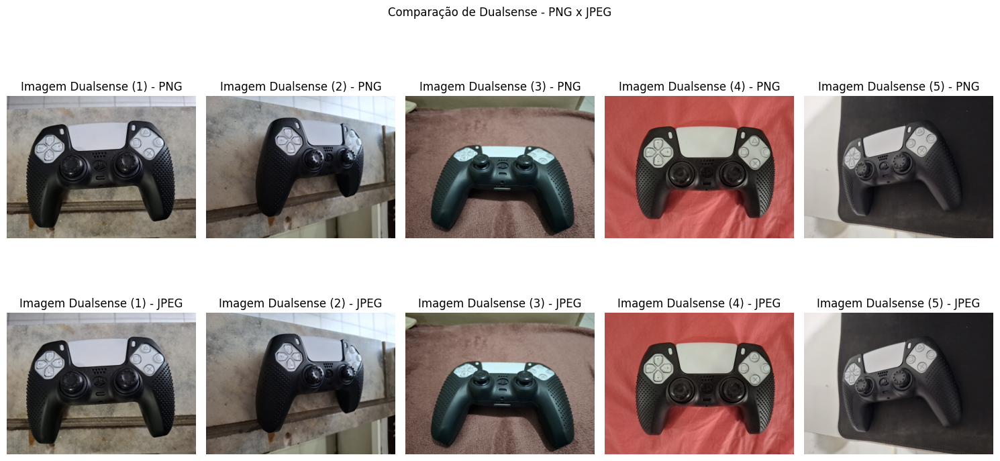

In [44]:
dualsense_png = arquivos_imagens[:5]
mouse_png = arquivos_imagens[5:]
dualsense_jpeg = arquivo_imagens_jpeg[:5]
mouse_jpeg = arquivo_imagens_jpeg[5:]

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(15, 8))

for i in range(2): 
    for j in range(5): 
        ax = axes[i][j]

        if (i == 0):
            imagem_aberta = PIL.Image.open(dualsense_png[j])
            ax.imshow(imagem_aberta)
            ax.set_title(f"Imagem Dualsense ({j+1}) - PNG")
            ax.axis("off")
        else: 
            imagem_aberta = PIL.Image.open(dualsense_jpeg[j])
            ax.imshow(imagem_aberta)
            ax.set_title(f"Imagem Dualsense ({j+1}) - JPEG")
            ax.axis("off")

fig.suptitle("Comparação de Dualsense - PNG x JPEG")
plt.tight_layout()
plt.show()

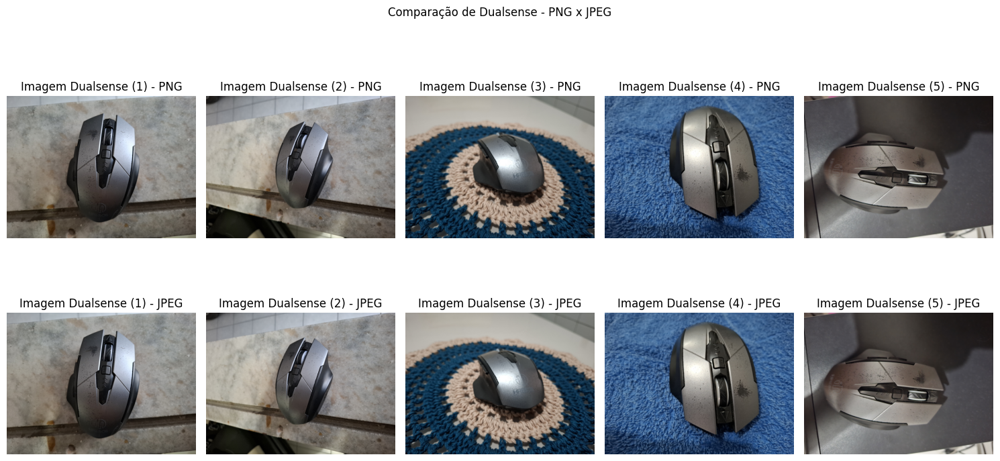

In [45]:
fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(15, 8))

for i in range(2): 
    for j in range(5): 
        ax = axes[i][j]

        if (i == 0):
            imagem_aberta = PIL.Image.open(mouse_png[j])
            ax.imshow(imagem_aberta)
            ax.set_title(f"Imagem Dualsense ({j+1}) - PNG")
            ax.axis("off")
        else: 
            imagem_aberta = PIL.Image.open(mouse_jpeg[j])
            ax.imshow(imagem_aberta)
            ax.set_title(f"Imagem Dualsense ({j+1}) - JPEG")
            ax.axis("off")

fig.suptitle("Comparação de Dualsense - PNG x JPEG")
plt.tight_layout()
plt.show()

### Veredito final sobre armazenamento em diferentes formatos:

A conversão das imagens foi bem útil em relação a custo de armazentamento, visto que as imagens em JPEG estão mais leves que as imagens em PNG:
- Tamanho da pasta com imagens JPEG: ~22MB
- Tamanho da paste com imagens PNG: ~93MB

Além disso, em decorrência das imagens terem uma resolução altíssima (4080 de altura x 3060 de largura), eu não percebi uma perda muito forte na qualidade das imagens. Diria até mesmo que foi quase imperceptível em uma visualização rápida, porém, em uma análise mais profunda, a compressão em JPEG pode ter adicionado artefatos como:
- alteração de bordas;
- texturas modificadas;
- omissão de detalhes;

O JPEG realiza uma compressão com perdas, reduzindo principalmente informações de alta frequência espacial da imagem, e por isso podem surgir os artefatos citados acima.
Esses artefatos podem atrapalhar o treinamento de um modelo de VC, visto que estaria sendo utilizado dados ruins/com artefatos. Eles podem virar, por exemplo, features falsas para o modelo, o que pode atrapalhar o resultado final do modelo.

Da mesma forma, esses artefatos podem impactar já no início no processamento de imagens, com perdas de altas frequências espaciais, problemas em equalizações de histogramas, quantizações e etc.


# 4 - Organizando o Dataset

Por fim, vamos agora organizar nosso dataset.

Ele deve ficar no seguinte formato: 

```
dataset/
├── classe_dualsense/
│   ├── img001_original.jpg
│   ├── img002_original.jpg
│   ├── img003_original.jpg
│   ├── img004_original.jpg
│   └── img005_original.jpg
│
└── classe_mouse/
    ├── img006_original.jpg
    ├── img007_original.jpg
    ├── img008_original.jpg
    ├── img009_original.jpg
    └── img010_original.jpg
```

In [46]:
pasta_png = Path("Imagens - Classes - VC")
pasta_jpeg = Path("Imagens - Classes - VC - JPEG")

dataset_path = Path("dataset")

classe_dualsense = "classe_dualsense"
classe_mouse = "classe_mouse"

arquivos_jpeg = sorted([
    arq for arq in pasta_jpeg.iterdir()
    if arq.is_file()
])

dualsense_jpeg = arquivos_jpeg[:5]
mouse_jpeg = arquivos_jpeg[5:]

def salvar_imagens(lista_arquivos, pasta_destino):

    pasta_destino.mkdir(parents=True, exist_ok=True)

    for arquivo in lista_arquivos:

        img = PIL.Image.open(arquivo)

        caminho_saida = pasta_destino / arquivo.name

        img.save(caminho_saida)

salvar_imagens(
    dualsense_jpeg,
    dataset_path / classe_dualsense
)

salvar_imagens(
    mouse_jpeg,
    dataset_path /  classe_mouse
)

print("Dataset criado com sucesso.")

Dataset criado com sucesso.


# Fim do projeto.